In [1]:
import pandas as pd
import anndata as ad
from loguru import logger 
import time

import numpy as np
import tifffile

import matplotlib.pyplot as plt
import seaborn as sns

import shapely
import geopandas as gpd

import os
import sys
sys.path.append(os.path.abspath('../scripts'))
import utils
import importlib

import scimap as sm

Running SCIMAP  2.1.3


In [10]:
#manual merge

# step 1, extract adata.X
X_991 = adata_991.X
X_992 = adata_992.X

X = np.concatenate([X_991, X_992], axis=0)

In [11]:
X.shape

(1615233, 8)

In [12]:
# extract adata.obs
obs_991 = adata_991.obs
obs_992 = adata_992.obs
obs = pd.concat([obs_991, obs_992], axis=0)

In [13]:
obs

,CellID,Y_centroid,X_centroid,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity,...,mean_DAPI_bg_abs_below_value,Area_filter_nottoobig,Area_filter_nottoolow,Area_filter,DAPI_ratio,DAPI_ratio_pass_nottoolow,DAPI_ratio_pass_nottoohigh,DAPI_ratio_pass,imageid,phenotype
0,0.0,29410.806452,35874.857801,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615,...,True,True,True,True,0.291466,True,True,True,991,Cancer_cells
1,1.0,29445.080408,36162.243140,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109,...,True,True,True,True,0.353388,True,True,True,991,Cancer_cells
2,2.0,29505.171707,38455.235122,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602,...,True,True,True,True,0.234700,True,True,True,991,Cancer_cells
3,3.0,29539.721673,35060.844867,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406,...,True,True,True,True,0.225623,True,True,True,991,CD4_Tcells
4,4.0,29982.642779,36765.660558,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743,...,True,True,True,True,0.217717,True,True,True,991,Cancer_cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1134342,1134342.0,27270.642157,37569.550980,1020.0,39.707795,32.947621,0.558132,-0.657307,121.639610,0.955951,...,True,True,True,True,0.335935,True,True,True,992,Unknown
1134343,1134343.0,27274.343598,38996.906807,1234.0,42.622618,37.495770,0.475501,0.465532,133.781746,0.964063,...,True,True,True,True,0.364614,True,True,True,992,Cancer_cells
1134344,1134344.0,27271.604926,37413.383251,1015.0,60.243974,22.812825,0.925530,-0.625325,144.509668,0.866041,...,True,True,True,True,0.353360,True,True,True,992,Cancer_cells
1134345,1134345.0,27272.320411,38221.301424,1264.0,50.722945,32.740800,0.763775,-1.218716,143.681241,0.953243,...,True,True,True,True,0.342360,True,True,True,992,Cancer_cells


In [17]:
unique_count = obs['CellID'].nunique()

# Check if the column has only unique values
if unique_count == len(obs):
    print("All values are unique")
else:
    print(f"There are {unique_count} unique values")

There are 1062489 unique values


In [14]:
obs.imageid.value_counts()

imageid
992    1005051
991     610182
Name: count, dtype: int64

In [58]:
# shall continue without touching the CellID column
# should reindex
obs = obs.reset_index(drop=True)

In [59]:
obs

,CellID,Y_centroid,X_centroid,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity,...,mean_DAPI_bg_abs_below_value,Area_filter_nottoobig,Area_filter_nottoolow,Area_filter,DAPI_ratio,DAPI_ratio_pass_nottoolow,DAPI_ratio_pass_nottoohigh,DAPI_ratio_pass,imageid,phenotype
0,0.0,29410.806452,35874.857801,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615,...,True,True,True,True,0.291466,True,True,True,991,Cancer_cells
1,1.0,29445.080408,36162.243140,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109,...,True,True,True,True,0.353388,True,True,True,991,Cancer_cells
2,2.0,29505.171707,38455.235122,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602,...,True,True,True,True,0.234700,True,True,True,991,Cancer_cells
3,3.0,29539.721673,35060.844867,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406,...,True,True,True,True,0.225623,True,True,True,991,CD4_Tcells
4,4.0,29982.642779,36765.660558,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743,...,True,True,True,True,0.217717,True,True,True,991,Cancer_cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615228,1134342.0,27270.642157,37569.550980,1020.0,39.707795,32.947621,0.558132,-0.657307,121.639610,0.955951,...,True,True,True,True,0.335935,True,True,True,992,Unknown
1615229,1134343.0,27274.343598,38996.906807,1234.0,42.622618,37.495770,0.475501,0.465532,133.781746,0.964063,...,True,True,True,True,0.364614,True,True,True,992,Cancer_cells
1615230,1134344.0,27271.604926,37413.383251,1015.0,60.243974,22.812825,0.925530,-0.625325,144.509668,0.866041,...,True,True,True,True,0.353360,True,True,True,992,Cancer_cells
1615231,1134345.0,27272.320411,38221.301424,1264.0,50.722945,32.740800,0.763775,-1.218716,143.681241,0.953243,...,True,True,True,True,0.342360,True,True,True,992,Cancer_cells


In [60]:
adata = ad.AnnData(X=X, obs=obs, var=adata_991.var)

/opt/homebrew/Caskroom/mambaforge/base/envs/scimap/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



In [61]:
adata.obs.imageid.value_counts()

imageid
992    1005051
991     610182
Name: count, dtype: int64

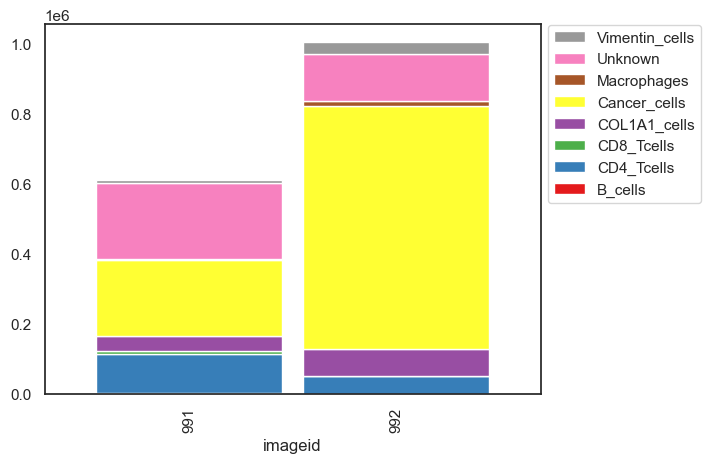

In [62]:
# plots the absolute count of cells within each ROI
sm.pl.stacked_barplot (adata,
                       x_axis='imageid',
                       y_axis='phenotype',
                       method='absolute')

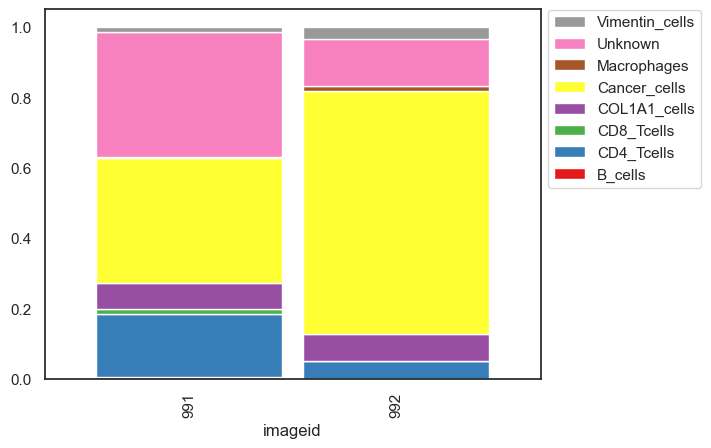

In [63]:
# plots the absolute count of cells within each ROI
sm.pl.stacked_barplot (adata,
                       x_axis='imageid',
                       y_axis='phenotype',
                       method='percent')

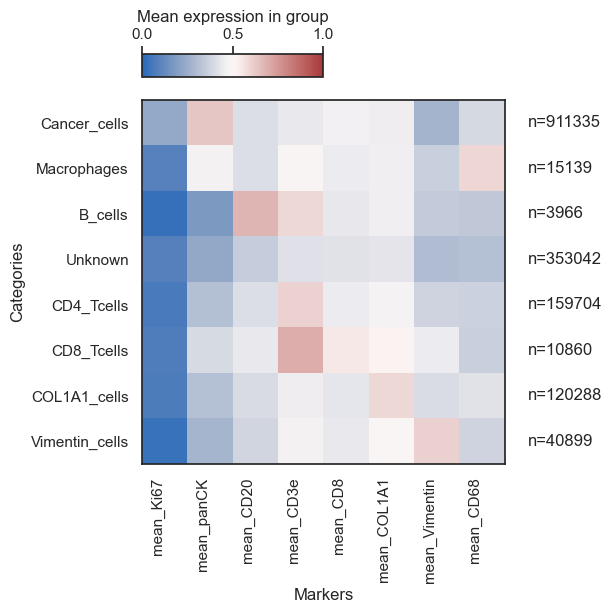

In [64]:
sm.pl.heatmap(adata, groupBy='phenotype', standardScale=None, figsize=(6,6), showPrevalence=True, vmin=0, vmax=1)

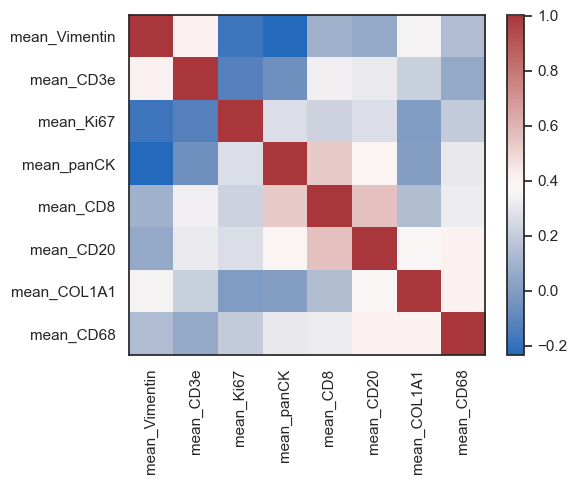

In [65]:
sm.pl.markerCorrelation(adata, figsize=(6,5), layer= None)

# Spatial analysis

In [66]:
adata = sm.tl.spatial_distance (adata, phenotype='phenotype')

Processing Image: 991
Processing Image: 992


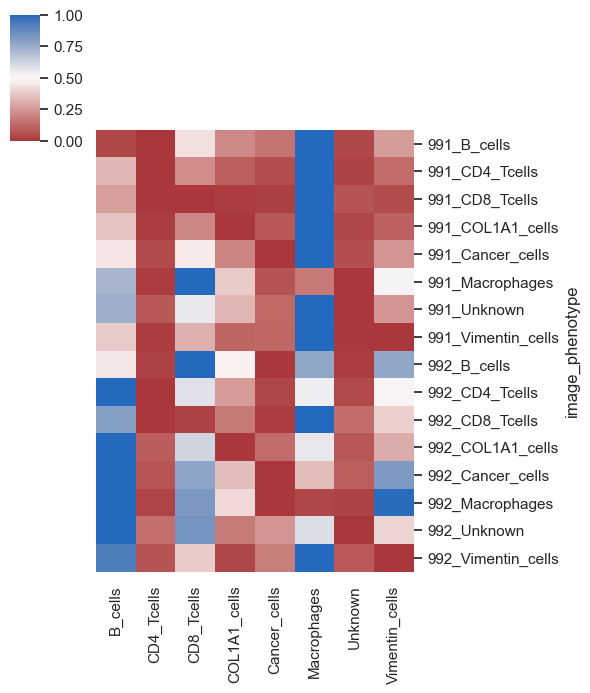

In [67]:
sm.pl.spatial_distance (adata, heatmap_summarize=False, figsize=(6,7))

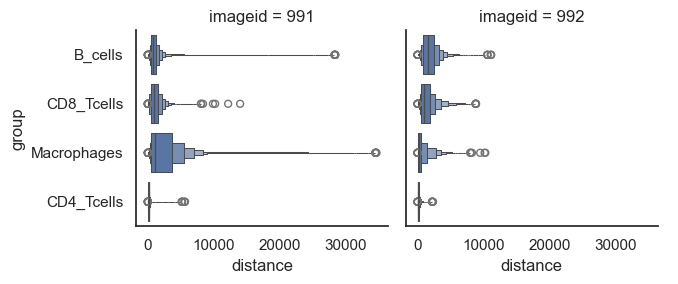

In [69]:
distance_to = ['B_cells', 'CD8_Tcells', 'Macrophages', 'CD4_Tcells']
sm.pl.spatial_distance (adata, method='numeric', 
                        distance_from='Cancer_cells', distance_to=distance_to, 
                        log=False, imageid='imageid', 
                        height=3, aspect=9/8)

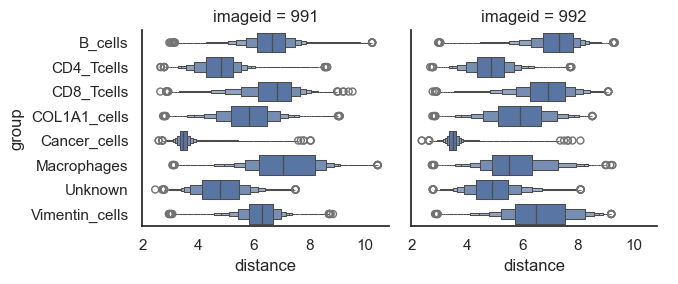

In [70]:
sm.pl.spatial_distance (adata, method='numeric',distance_from='Cancer_cells', log=True, imageid='imageid', height=3, aspect=9/8)

In [ ]:
# something broke
#it was the index of obs

In [71]:
adata = sm.tl.spatial_count(adata, phenotype='phenotype', method='knn', knn=12, label='spatial_count_knn12')

Identifying the 12 nearest neighbours for every cell
Identifying the 12 nearest neighbours for every cell


In [73]:
adata = sm.tl.spatial_cluster(adata, df_name='spatial_count_knn12', method='kmeans', k=5, label='neigh_kmeans_k5')

Kmeans clustering


In [74]:
adata = sm.tl.spatial_cluster(adata, df_name='spatial_count_knn12', method='kmeans', k=7, label='neigh_kmeans_k7')

Kmeans clustering


In [75]:
adata = sm.tl.spatial_cluster(adata, df_name='spatial_count_knn12', method='kmeans', k=9, label='neigh_kmeans_k9')

Kmeans clustering


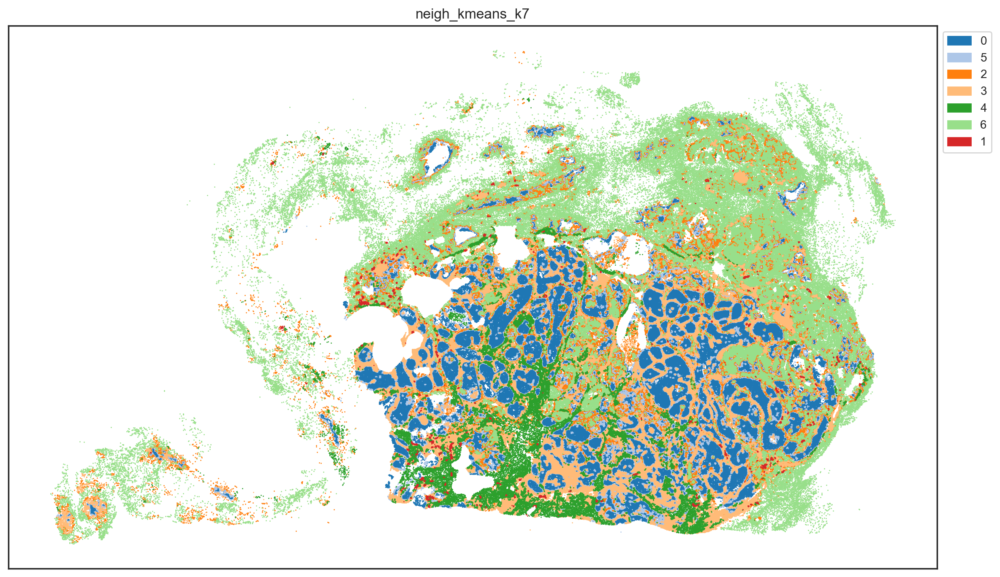

In [77]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['neigh_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=1, fontsize=10)

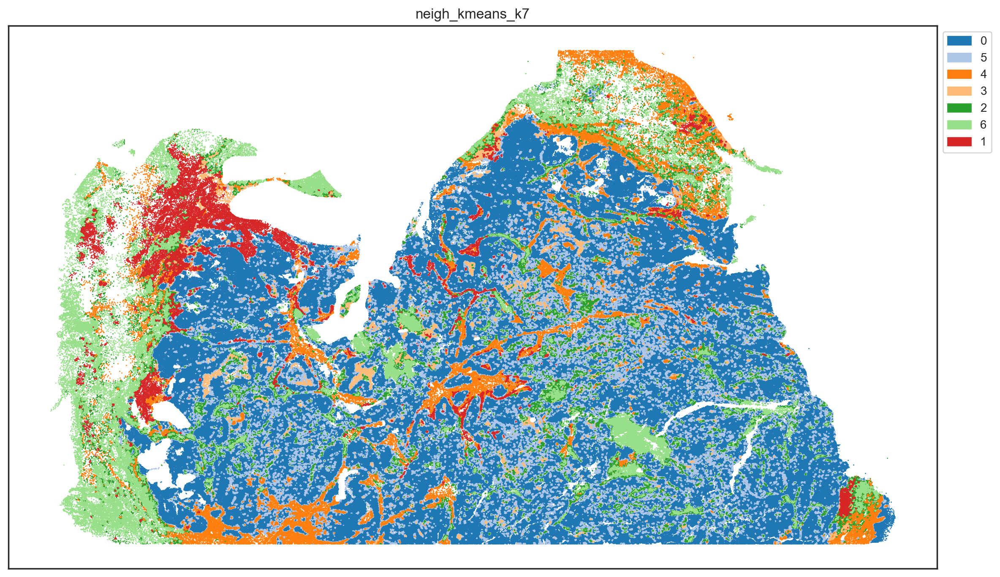

In [78]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['neigh_kmeans_k7'],
                        imageid='imageid',
                        subset='992',                        
                        figsize=(12,7), s=1, fontsize=10)

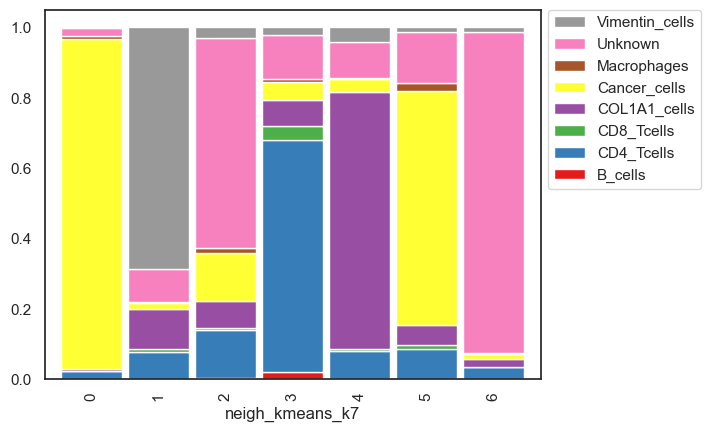

In [83]:
sm.pl.stacked_barplot (adata, x_axis='neigh_kmeans_k7', y_axis='phenotype')

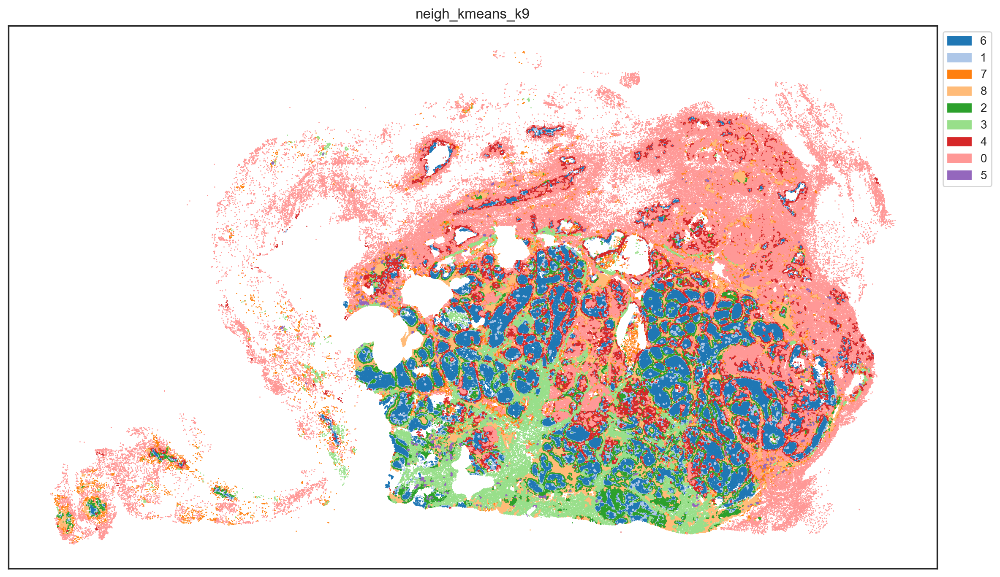

In [79]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['neigh_kmeans_k9'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=1, fontsize=10)

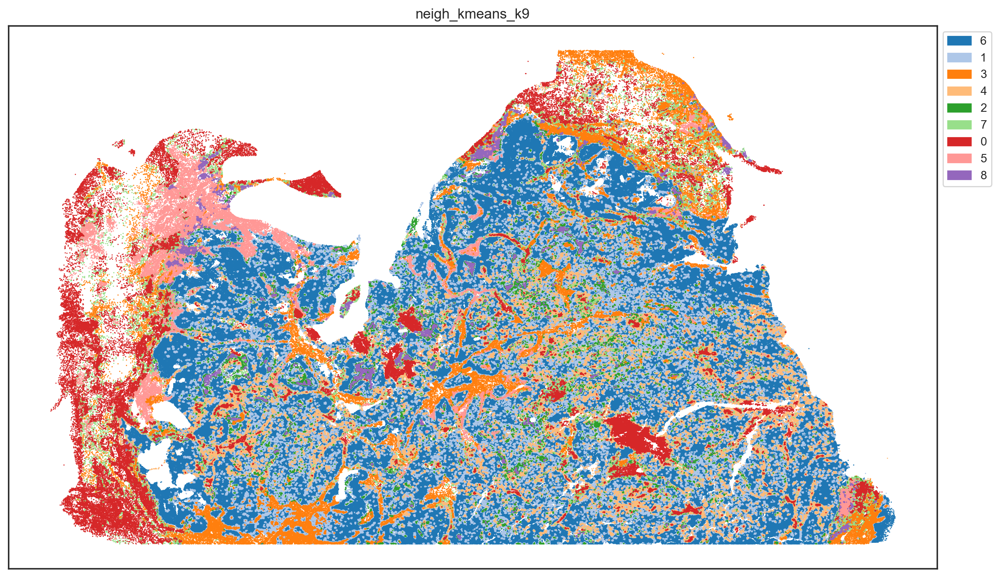

In [80]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['neigh_kmeans_k9'],
                        imageid='imageid',
                        subset='992',                        
                        figsize=(12,7), s=1, fontsize=10)

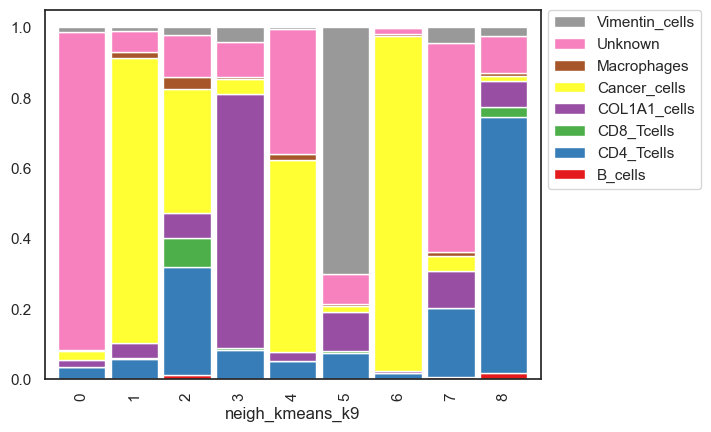

In [84]:
sm.pl.stacked_barplot (adata, x_axis='neigh_kmeans_k9', y_axis='phenotype')

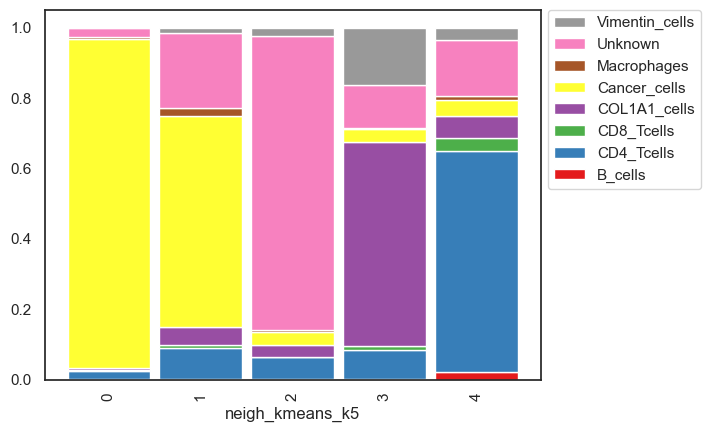

In [85]:
sm.pl.stacked_barplot (adata, x_axis='neigh_kmeans_k5', y_axis='phenotype')

# Lets use Spatial LDA

In [86]:
adata = sm.tl.spatial_lda(adata, method='knn', knn=12, label='spatial_lda')

Processing: ['991']
Identifying the 12 nearest neighbours for every cell
Processing: ['992']
Identifying the 12 nearest neighbours for every cell
Pre-Processing Spatial LDA
Training Spatial LDA
Calculating the Coherence Score

Coherence Score:  0.33982019129314756
Gathering the latent weights


In [87]:
adata = sm.tl.spatial_cluster(adata, df_name='spatial_lda', method='kmeans', k=7, label='spatial_lda_kmeans_k7')

Kmeans clustering


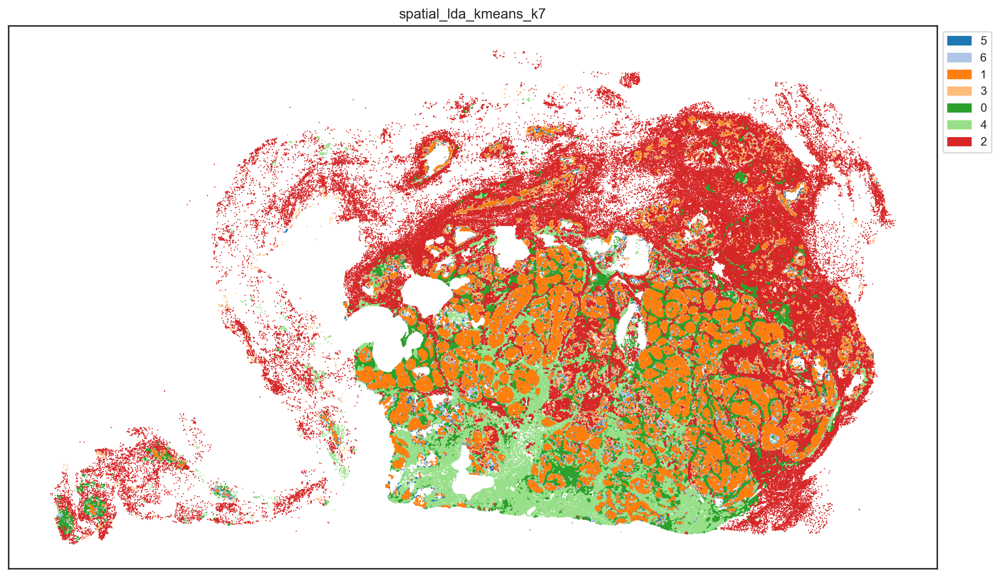

In [88]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['spatial_lda_kmeans_k7'],
                        imageid='imageid',
                        subset='991',                        
                        figsize=(12,7), s=1, fontsize=10)

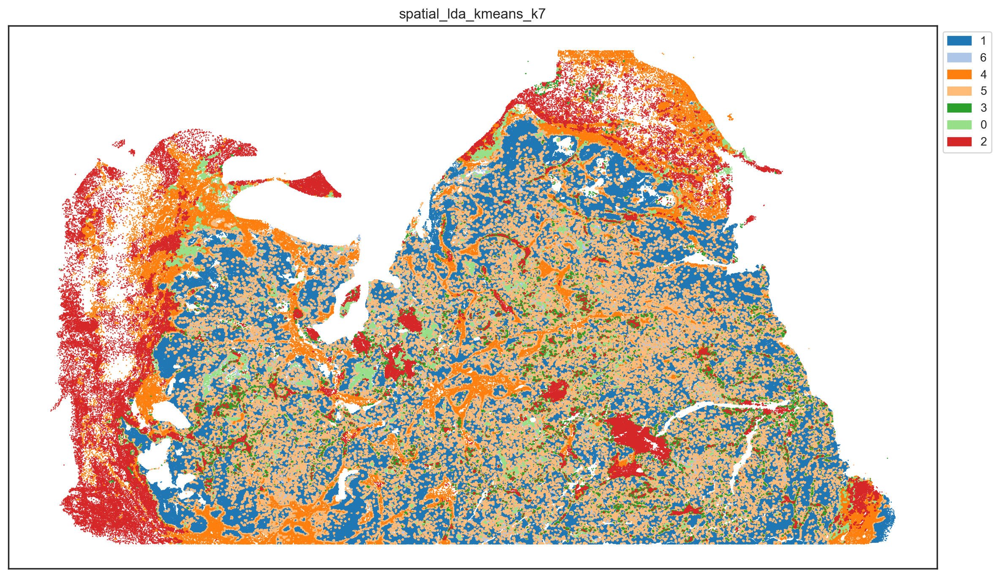

In [89]:
sm.pl.spatial_scatterPlot (adata, colorBy = ['spatial_lda_kmeans_k7'],
                        imageid='imageid',
                        subset='992',                        
                        figsize=(12,7), s=1, fontsize=10)

In [90]:
adata.obs.dtypes

CellID                           float64
Y_centroid                       float64
X_centroid                       float64
Area                             float64
MajorAxisLength                  float64
MinorAxisLength                  float64
Eccentricity                     float64
Orientation                      float64
Extent                           float64
Solidity                         float64
filter_by_ann                     object
mean_DAPI_bg_abs_above_value      object
mean_DAPI_bg_abs_below_value      object
Area_filter_nottoobig             object
Area_filter_nottoolow             object
Area_filter                       object
DAPI_ratio                       float64
DAPI_ratio_pass_nottoolow         object
DAPI_ratio_pass_nottoohigh        object
DAPI_ratio_pass                   object
imageid                           object
phenotype                       category
neigh_kmeans_k5                   object
neigh_kmeans_k7                   object
neigh_kmeans_k9 

In [91]:
object_columns = adata.obs.select_dtypes(include='object').columns

In [92]:
object_columns

Index(['filter_by_ann', 'mean_DAPI_bg_abs_above_value',
       'mean_DAPI_bg_abs_below_value', 'Area_filter_nottoobig',
       'Area_filter_nottoolow', 'Area_filter', 'DAPI_ratio_pass_nottoolow',
       'DAPI_ratio_pass_nottoohigh', 'DAPI_ratio_pass', 'imageid',
       'neigh_kmeans_k5', 'neigh_kmeans_k7', 'neigh_kmeans_k9',
       'spatial_lda_kmeans_k7'],
      dtype='object')

In [93]:
adata.obs.head()

,CellID,Y_centroid,X_centroid,Area,MajorAxisLength,MinorAxisLength,Eccentricity,Orientation,Extent,Solidity,...,DAPI_ratio,DAPI_ratio_pass_nottoolow,DAPI_ratio_pass_nottoohigh,DAPI_ratio_pass,imageid,phenotype,neigh_kmeans_k5,neigh_kmeans_k7,neigh_kmeans_k9,spatial_lda_kmeans_k7
0,0.0,29410.806452,35874.857801,1519.0,98.696620,30.646839,0.950568,-1.524977,228.651804,0.676615,...,0.291466,True,True,True,991,Cancer_cells,0,0,6,5
1,1.0,29445.080408,36162.243140,1567.0,50.422862,39.687556,0.616832,0.160002,148.710678,0.975109,...,0.353388,True,True,True,991,Cancer_cells,0,5,1,6
2,2.0,29505.171707,38455.235122,1025.0,40.280587,34.195207,0.528513,-0.346644,131.438600,0.927602,...,0.234700,True,True,True,991,Cancer_cells,0,0,6,1
3,3.0,29539.721673,35060.844867,1315.0,61.049935,28.208869,0.886848,-1.447088,151.254834,0.947406,...,0.225623,True,True,True,991,CD4_Tcells,4,2,7,3
4,4.0,29982.642779,36765.660558,3656.0,84.178897,57.384893,0.731630,0.251203,243.379726,0.926743,...,0.217717,True,True,True,991,Cancer_cells,0,0,6,1


In [98]:
adata.obs[object_columns] = adata.obs[object_columns].astype(np.dtype('str'))

In [99]:
adata.obs.dtypes

CellID                           float64
Y_centroid                       float64
X_centroid                       float64
Area                             float64
MajorAxisLength                  float64
MinorAxisLength                  float64
Eccentricity                     float64
Orientation                      float64
Extent                           float64
Solidity                         float64
filter_by_ann                     object
mean_DAPI_bg_abs_above_value      object
mean_DAPI_bg_abs_below_value      object
Area_filter_nottoobig             object
Area_filter_nottoolow             object
Area_filter                       object
DAPI_ratio                       float64
DAPI_ratio_pass_nottoolow         object
DAPI_ratio_pass_nottoohigh        object
DAPI_ratio_pass                   object
imageid                           object
phenotype                       category
neigh_kmeans_k5                   object
neigh_kmeans_k7                   object
neigh_kmeans_k9 

In [100]:
adata.write_h5ad('../data/processed/20241002_991_992_RCN.h5ad')

In [101]:
adata.obs.to_csv('../data/processed/20241002_2104_adataobs_RCN.csv')